# Goal
- Align the spatial data to histology image
- Optional: collapse 2 pucks (2 differt slices, but so close that cna be considered as one)

In [1]:
%load_ext autoreload
%autoreload 2


import scanpy as sc
import seaborn as sns
import pandas as pd
from scipy.stats import median_abs_deviation
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt
import scrublet as scr
from tqdm.notebook import tqdm
from diptest import diptest
from scipy.sparse import csr_matrix
import anndata as ad
import math
import scvi
from dotenv import load_dotenv; load_dotenv()
import json
import os


from utils import preprocessing

# Hyperparamyters
ADATA_PATH = "/home/gdallagl/myworkdir/XDP/data/XDP/disease/diseased_1/diseased_1_adata.h5ad"
NISSEL_IMAGE_PATH = "/home/gdallagl/myworkdir/XDP/data/XDP/disease/diseased_1/images/XDP_CAP_Nissl.jpg"

# Prerequisites

Download all tools and data necessary for manual alignement on yout PC.

Follow info at: [https://github.com/mukundraj/slidetag-pipeline?tab=readme-ov-file](mukundraj/slidetag-pipeline)

In [2]:
adata = sc.read_h5ad(ADATA_PATH)
adata

AnnData object with n_obs × n_vars = 84669 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'my_hierarchy', 'my_hierarchy_all', 'library', 'library_name', 'leiden_scANVI', 'category_all_cell_types', 'category_only_SPN', 'category_striosome_matrix', 'category_dorsal_ventral', 'category_d1_d2', 'category_intrinsic

# Prepare coord csv of single slice for registration

## Split 2 Slices and Center

In [3]:
# Create spatial matrix with NaN by default
spatial_coords = np.full((adata.n_obs, 2), np.nan)
# For cells with has_spatial == True, add their real coordinates
mask = adata.obs['has_spatial'] == True
spatial_coords[mask] = adata.obs.loc[mask, ['x', 'y']].values
# Assign to obsm
adata.obsm['spatial'] = spatial_coords

In [11]:
coord_df = pd.DataFrame(adata.obsm['spatial'], columns=["x", "y"])
coord_df["Neighborhood_name"] = adata.obs["Neighborhood_name"].values
coord_df["is_neuron"] = [True if ct != "Nonneuron" else np.nan for ct in coord_df.Neighborhood_name]
coord_df.index = adata.obs_names
display(coord_df)
coord_df.x.value_counts(dropna=False)

,x,y,Neighborhood_name,is_neuron
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGCATGGAG-1-SI-TT-H1,21225.159553,4193.340108,Nonneuron,NaN
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGGCGGAGT-1-SI-TT-H1,16429.015488,3852.143369,Nonneuron,NaN
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGGTCTATG-1-SI-TT-H1,NaN,NaN,Nonneuron,NaN
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAAAGGTTGTAT-1-SI-TT-H1,14118.369028,-4852.270550,Nonneuron,NaN
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H1---AAACCAGCAAATTGCC-1-SI-TT-H1,56670.296375,8783.447219,Subpallium GABA,True
...,...,...,...,...
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H3---GTTGTGGGTACGTGAT-1-SI-TT-H3,7312.232149,5689.570899,Nonneuron,NaN
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H3---GTTGTGGGTAGGCATT-1-SI-TT-H3,11313.567114,8499.633020,Nonneuron,NaN
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H3---GTTGTGGGTATCGTGG-1-SI-TT-H3,31393.199291,-120.827487,Subpallium GABA,True
240805_SL-EXD_0328_B22FKKYLT4---SI-TT-H3---GTTGTGGGTCATACCC-1-SI-TT-H3,46188.098628,-7745.600240,Nonneuron,NaN


x
NaN             20265
8185.611756         1
10041.594861        1
54472.922664        1
42372.407675        1
                ...  
3832.730716         1
46428.135166        1
10791.049393        1
10418.770319        1
48058.220194        1
Name: count, Length: 64405, dtype: int64

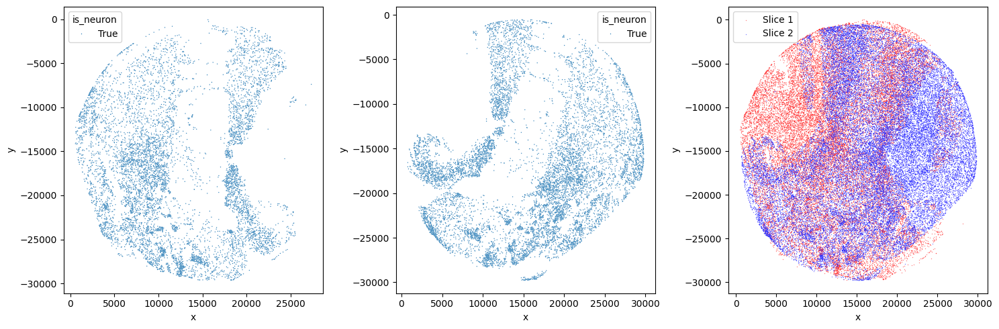

In [12]:
x_max = coord_df.x.max()
x_mid = int(x_max/2)
x_1_4 = int(x_max/4)      # Center of left slice
x_3_4 = int(3*x_max/4)    # Center of right slice (fixed typo)

y_max = coord_df.y.max()
y_mid = int(y_max/2)

# Split slices

coord_df_slice_1 = coord_df[coord_df.x <= x_mid].copy()
coord_df_slice_2 = coord_df[coord_df.x > x_mid].copy()

# Center slice 1 at its own center (left quarter)
#coord_df_slice_1.x -= x_1_4
coord_df_slice_1.y -= y_max

# Center slice 2 at its own center (right three-quarter)
coord_df_slice_2.x -= x_mid
coord_df_slice_2.y -= y_max

def plot_2_slices(coord_df_slice_1, coord_df_slice_2):
    fig, ax = plt.subplots(1,3,figsize=(15,5))

    sns.scatterplot(coord_df_slice_1, x="x", y="y", hue="is_neuron", ax=ax[0], s=1)

    sns.scatterplot(coord_df_slice_2, x="x", y="y", hue="is_neuron", ax=ax[1], s=1)

    sns.scatterplot(data=coord_df_slice_1, x="x", y="y", ax=ax[2], s=1, color='red', alpha=0.5, label='Slice 1')
    sns.scatterplot(data=coord_df_slice_2, x="x", y="y", ax=ax[2], s=1, color='blue', alpha=0.5, label='Slice 2')

    plt.tight_layout()

plot_2_slices(coord_df_slice_1, coord_df_slice_2)

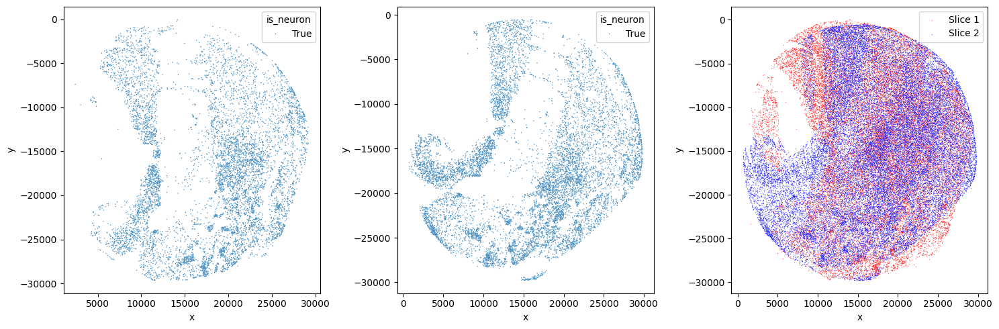

In [13]:
coord_df_slice_1['x'] = x_mid - coord_df_slice_1['x']
plot_2_slices(coord_df_slice_1, coord_df_slice_2)

In [7]:
def rotate_slice(df, angle_degrees):
    """Rotate coordinates by angle (in degrees) around the slice's center"""
    angle_rad = np.radians(angle_degrees)
    cos_a = np.cos(angle_rad)
    sin_a = np.sin(angle_rad)
    
    # Find center of the slice
    x_center = df['x'].mean()
    y_center = df['y'].mean()
    
    # Translate to origin
    x_temp = df['x'] - x_center
    y_temp = df['y'] - y_center
    
    # Rotate
    x_rot = x_temp * cos_a - y_temp * sin_a
    y_rot = x_temp * sin_a + y_temp * cos_a
    
    # Translate back
    df['x'] = x_rot + x_center
    df['y'] = y_rot + y_center
    
    return df

# coord_df_slice_1_cp = coord_df_slice_1.copy()
# rotate_slice(coord_df_slice_1_cp, -25)  # Rotate 45 degrees
# plot_2_slices(coord_df_slice_1_cp, coord_df_slice_2)

Best rotation angle: 333.1°


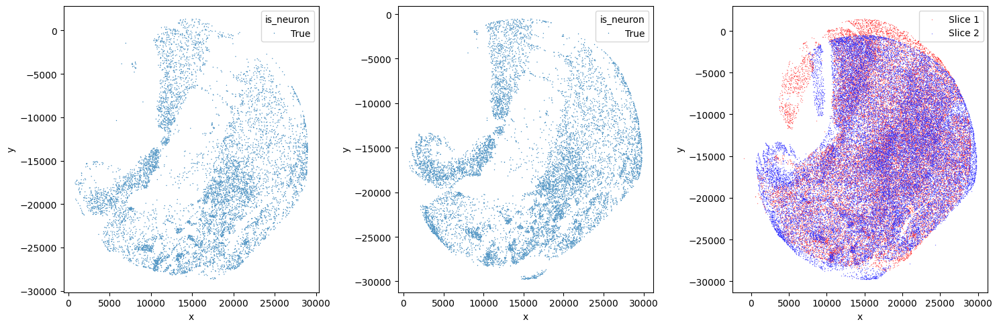

In [8]:
def find_best_rotation(df1, df2):
    """Find rotation angle that maximizes overlap between two slices
    For each point in rotated slice 1, finds nearest neighbor in slice 2
    method='bounded' uses Brent's method (smart search, not brute force)
    Returns mean distance to nearest neighbors
    """

    from scipy.optimize import minimize_scalar
    from scipy.spatial import cKDTree
    
    def overlap_score(angle):
        # Rotate df1
        df1_rot = rotate_slice(df1.copy(), angle)
        
        # Build KDTree for fast nearest neighbor search
        tree = cKDTree(df2[['x', 'y']].values)
        
        # Find mean distance to nearest points in df2
        distances, _ = tree.query(df1_rot[['x', 'y']].values)
        
        return distances.mean()  # Minimize this
    
    # Find best angle between 0 and 360 degrees
    result = minimize_scalar(overlap_score, bounds=(0, 360), method='bounded')
    
    return result.x

# Usage:
coord_df_slice_1_cp = coord_df_slice_1.copy()

best_angle = find_best_rotation(coord_df_slice_1_cp, coord_df_slice_2)
print(f"Best rotation angle: {best_angle:.1f}°")
rotate_slice(coord_df_slice_1_cp, best_angle)
plot_2_slices(coord_df_slice_1_cp, coord_df_slice_2)

coord_df_slice_1 = coord_df_slice_1_cp.copy()

In [10]:
ersvs

NameError: name 'ersvs' is not defined

In [ ]:
from pycpd import RigidRegistration, DeformableRegistration
import numpy as np

coord_df_slice_1_cp = coord_df_slice_1.copy()

# Subsample for fast initial alignment
n_samples = int(0.1 * len(coord_df_slice_1_cp))
print(f"Subsampling: {n_samples} points from {len(coord_df_slice_1_cp)}")
idx1 = np.random.choice(len(coord_df_slice_1_cp), n_samples, replace=False)
idx2 = np.random.choice(len(coord_df_slice_2), n_samples, replace=False)

X_sub = coord_df_slice_2.iloc[idx2][['x', 'y']].values
Y_sub = coord_df_slice_1_cp.iloc[idx1][['x', 'y']].values

# Quick registration on subset
print("Step 1: Rigid registration on subset...")
reg_rigid_sub = RigidRegistration(X=X_sub, Y=Y_sub)
TY_rigid_sub, (s, R, t) = reg_rigid_sub.register()
print(f"  Scale: {s:.3f}, Rotation: {np.degrees(np.arctan2(R[1,0], R[0,0])):.1f}°")

# Apply to full dataset
print("Step 2: Applying rigid transform to full dataset...")
X_full = coord_df_slice_2[['x', 'y']].values
Y_full = coord_df_slice_1_cp[['x', 'y']].values
Y_full_rigid = s * np.dot(Y_full, R) + t

# Deformable on full dataset
print("Step 3: Deformable refinement on full dataset...")
reg_deform = DeformableRegistration(
    X=X_full, 
    Y=Y_full_rigid, 
    alpha=2, 
    beta=3,
    max_iterations=1,
    low_rank=True,          # Enable fast mode
    num_eig=50              # Use 50 eigenvectors (lower = faster
)
TY_final, _ = reg_deform.register()

# Update
coord_df_slice_1_cp[['x', 'y']] = TY_final

# Plot
plot_2_slices(coord_df_slice_1_cp, coord_df_slice_2)

Step 3: Deformable refinement on full dataset...


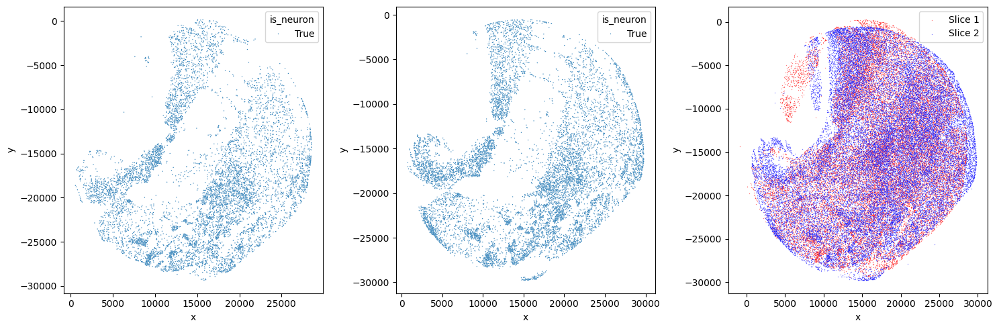

In [14]:
# Deformable on full dataset
print("Step 3: Deformable refinement on full dataset...")
reg_deform = DeformableRegistration(
    X=X_full, 
    Y=Y_full_rigid, 
    alpha=2, 
    beta=3,
    max_iterations=1,
    low_rank=True,          # Enable fast mode
    num_eig=50              # Use 50 eigenvectors (lower = faster
)
TY_final, _ = reg_deform.register()

# Update
coord_df_slice_1_cp[['x', 'y']] = TY_final

# Plot
plot_2_slices(coord_df_slice_1_cp, coord_df_slice_2)

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Subsampling to 20000 points for GPU registration...
Running GPU CPD registration on subset...
✅ Done!


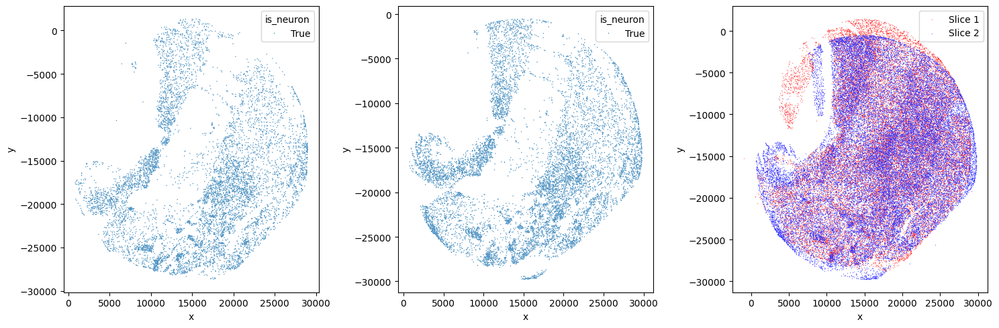

In [9]:
import numpy as np
import cupy as cp
from probreg import cpd

coord_df_slice_1_cp = coord_df_slice_1.copy()

# SUBSAMPLE
n_samples = min(20000, len(coord_df_slice_1_cp))
print(f"Subsampling to {n_samples} points for GPU registration...")

idx1 = np.random.choice(len(coord_df_slice_1_cp), n_samples, replace=False)
idx2 = np.random.choice(len(coord_df_slice_2), n_samples, replace=False)

source_sub = cp.asarray(np.column_stack([
    coord_df_slice_1_cp.iloc[idx1]['x'].values,
    coord_df_slice_1_cp.iloc[idx1]['y'].values,
    np.zeros(n_samples)
]).astype(np.float32))

target_sub = cp.asarray(np.column_stack([
    coord_df_slice_2.iloc[idx2]['x'].values,
    coord_df_slice_2.iloc[idx2]['y'].values,
    np.zeros(n_samples)
]).astype(np.float32))

# GPU registration
print("Running GPU CPD registration on subset...")
cpd_reg = cpd.NonRigidCPD(source_sub, use_cuda=True)
cpd_reg.beta = 3.0

# Run registration
result = cpd_reg.registration(target_sub, w=0.0, maxiter=50, tol=0.001)

# Get transformation from the cpd_reg object (not from result!)
source_transformed = cp.asnumpy(result.transformation.transform(source_sub))

# Update only the subsampled points
coord_df_slice_1_cp.loc[coord_df_slice_1_cp.index[idx1], ['x', 'y']] = source_transformed[:, :2]

print("✅ Done!")
plot_2_slices(coord_df_slice_1_cp, coord_df_slice_2)

In [30]:
coord_df_slice_1_cp.to_csv('/home/gdallagl/myworkdir/XDP/data/_tmp/slice_1_registered_gpu.csv', index=False)
#coord_df_slice_1_cp = pd.read_csv('/home/gdallagl/myworkdir/XDP/data/_tmp/slice_1_registered_gpu.csv')


In [51]:
import numpy as np
import pandas as pd

# Initialize slice column
adata.obs['slice'] = 'no_spatial'

# Assign slice_1 cells DIRECTLY from coord_df_slice_1_cp
slice1_barcodes = coord_df_slice_1_cp.index.intersection(adata.obs.index)
adata.obs.loc[slice1_barcodes, 'slice'] = 'slice_1'
print(f"Slice 1: {len(slice1_barcodes)} cells assigned")

# Assign slice_2 cells DIRECTLY from coord_df_slice_2
slice2_barcodes = coord_df_slice_2.index.intersection(adata.obs.index)
adata.obs.loc[slice2_barcodes, 'slice'] = 'slice_2'
print(f"Slice 2: {len(slice2_barcodes)} cells assigned")

# Check for overlaps
overlap = set(slice1_barcodes) & set(slice2_barcodes)
if len(overlap) > 0:
    print(f"⚠️ WARNING: {len(overlap)} barcodes in BOTH slices!")

# Now update spatial coordinates
adata.obsm["spatial"] = np.full((adata.n_obs, 2), np.nan)

# Assign slice_1 coordinates
adata.obsm["spatial"][adata.obs.index.isin(slice1_barcodes), :] = \
    coord_df_slice_1_cp.loc[slice1_barcodes, ['x', 'y']].values

# Assign slice_2 coordinates
adata.obsm["spatial"][adata.obs.index.isin(slice2_barcodes), :] = \
    coord_df_slice_2.loc[slice2_barcodes, ['x', 'y']].values

print(f"\n✅ Slice distribution:")
print(adata.obs['slice'].value_counts())

Slice 1: 29044 cells assigned
Slice 2: 35360 cells assigned

✅ Slice distribution:
slice
slice_2       35360
slice_1       29044
no_spatial    20265
Name: count, dtype: int64


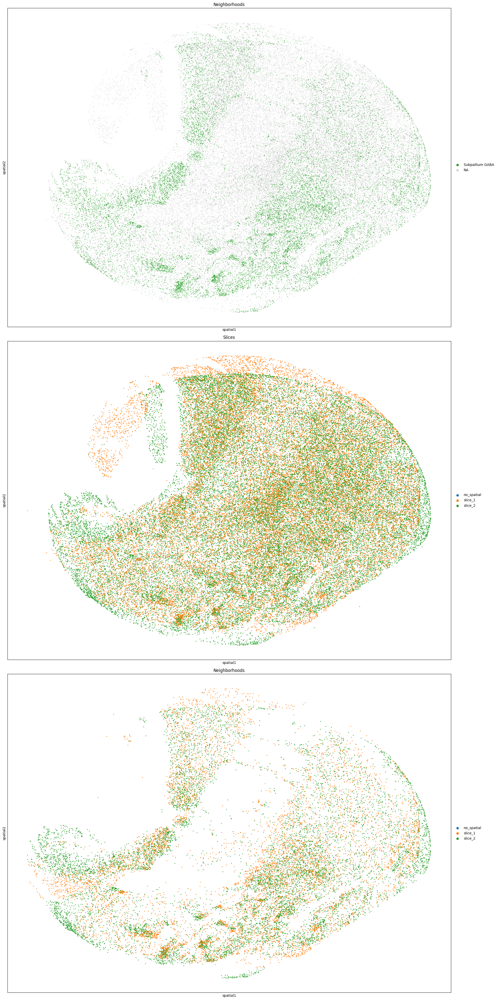

In [55]:
import matplotlib.pyplot as plt

# Create custom figure
fig, axes = plt.subplots(3,1, figsize=(20, 40))

sc.pl.embedding(adata, basis="spatial", color="Neighborhood_name", 
                groups=["Subpallium GABA"], size=10, ax=axes[0], show=False)
axes[0].set_title('Neighborhoods')

sc.pl.embedding(adata, basis="spatial", color="slice", size=20, 
                ax=axes[1], show=False)
axes[1].set_title('Slices')

adata_n = adata[adata.obs.Neighborhood_name != "Nonneuron"]
sc.pl.embedding(adata_n, basis="spatial", color="slice", 
                size=20, ax=axes[2], show=False)
axes[2].set_title('Neighborhoods')

plt.tight_layout()
plt.show()

## Align image 2 to image 1

## Save Image one locations

In [ ]:
coord_1 = adata_slice_1.obsm["spatial_final"].copy()
coord_2 = adata_slice_2.obsm["spatial_final"].copy() # ATTENTION rot!

# Save slice 1
df = pd.DataFrame({
    's_1': coord_1[:, 0],
    's_2': coord_1[:, 1],
    'bead_numis': adata_slice_1.obs['total_counts'].astype(int).values,
    'category': [1 if ct == CELL_TYPE_FOR_DISCRIMINATION else 0 for ct in adata_slice_1.obs[CELL_TYPE_ANNOTATION]],
})
df.to_csv("/home/gdallagl/myworkdir/XDP/data/_tmp/single_slice_1.csv", index=False)

# Save slice 2
df = pd.DataFrame({
    's_1': coord_2[:, 0],
    's_2': coord_2[:, 1],
    'bead_numis': adata_slice_2.obs['total_counts'].astype(int).values,
    'category': [1 if ct == CELL_TYPE_FOR_DISCRIMINATION else 0 for ct in adata_slice_2.obs[CELL_TYPE_ANNOTATION]],
})
df.to_csv("/home/gdallagl/myworkdir/XDP/data/_tmp/single_slice_2.csv",index=False)


## Save Nissl Image

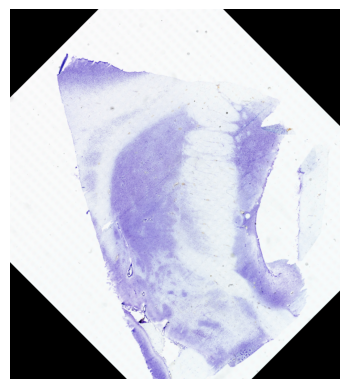

(3343, 3748)


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load JPG
img = Image.open(NISSEL_IMAGE_PATH)

# Rotate 180 degrees
#img = img.rotate(180)
img = img.transpose(Image.FLIP_LEFT_RIGHT)
img = img.rotate(45, expand=False) #counter-clockwise


# Save as PNG
img.save("/home/gdallagl/myworkdir/XDP/data/_tmp/nissl.png", "PNG")

# Plot the rotated image
plt.imshow(img)
plt.axis("off")
plt.show()

print(img.size)


# Overlay

In [ ]:
import numpy as np

path = "/home/gdallagl/myworkdir/XDP/data/_tmp/single_slice_1_coords.png_on_fixed.txt"

arr = np.loadtxt(path, delimiter=",")
print(arr.shape)
print(arr)

adata_slice_1.obsm['spatial'] = arr

print(np.min(arr), np.max(arr))

(29044, 2)
[[-785.74225171 -333.2866044 ]
 [-832.51511544 -328.38282987]
 [-852.25621352 -242.53769022]
 ...
 [-780.8744746  -359.45252581]
 [-922.23659852 -343.3631503 ]
 [-884.04071023 -372.14126512]]
-987.7237414473301 -147.14372186591095


In [ ]:
arr[:, 0 ] += np.abs(np.min(arr[:, 0]))
arr[:, 1 ] += np.abs(np.min(arr[:, 1]))
print(np.min(arr[:, 0 ]), np.min(arr[:, 1 ]))
arr

0.0 0.0


array([[201.98148974, 105.01868449],
       [155.20862601, 109.92245903],
       [135.46752793, 195.76759868],
       ...,
       [206.84926685,  78.85276308],
       [ 65.48714293,  94.9421386 ],
       [103.68303122,  66.16402377]], shape=(29044, 2))

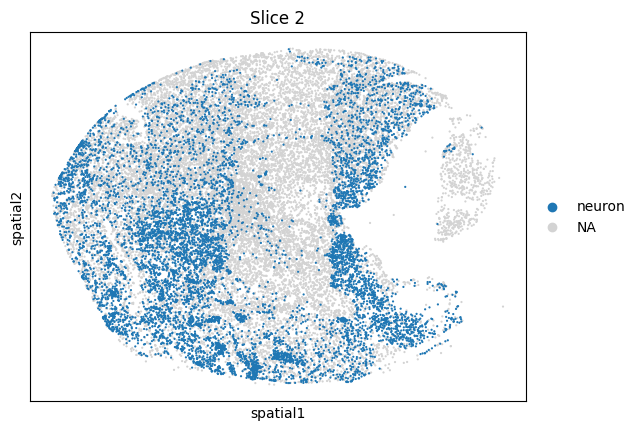

In [ ]:
sc.pl.embedding(adata_slice_1, basis="spatial", color=CELL_TYPE_ANNOTATION,
                groups=[CELL_TYPE_FOR_DISCRIMINATION], size=10, title="Slice 2")

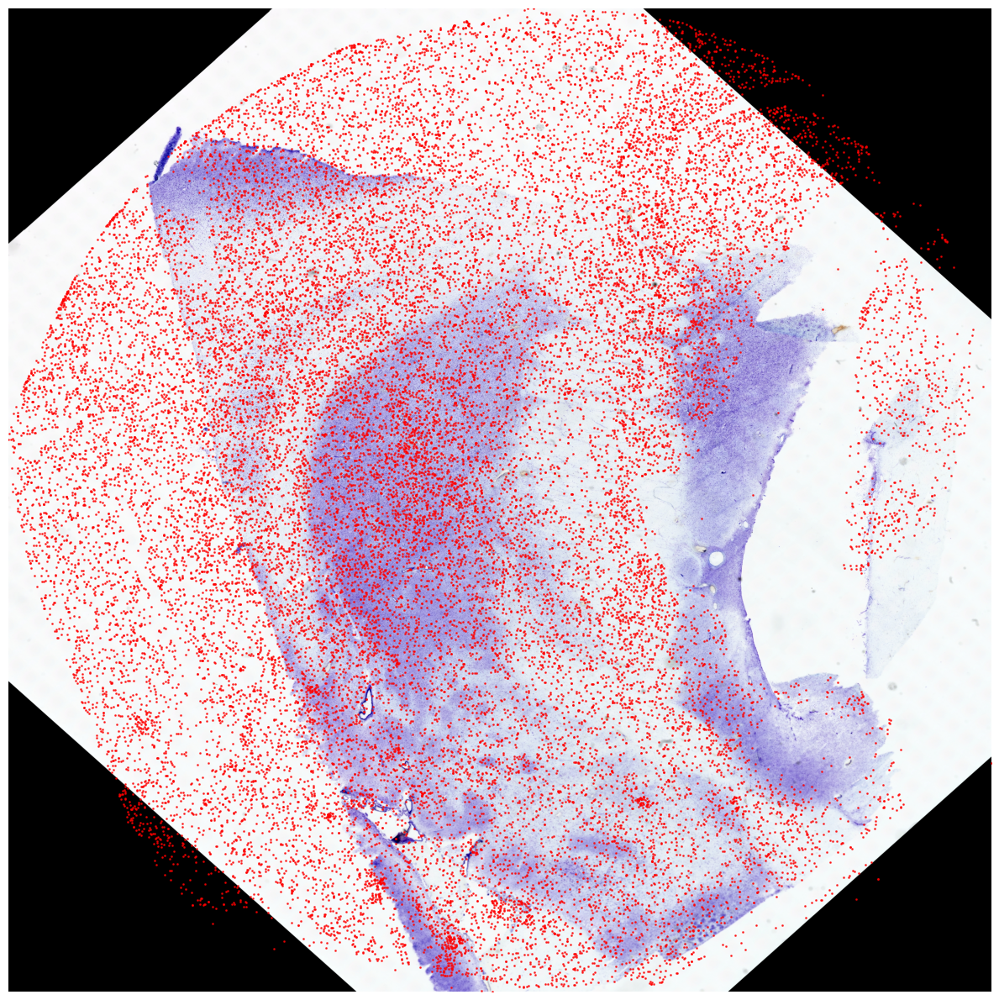

In [ ]:
# new_width = 200  # adjust as needed
# new_height = 200  # adjust as needed
# img = img.resize((new_width, new_height), Image.LANCZOS)



# Plot with explicit extent to align them
fig, ax = plt.subplots(figsize=(12, 12))

# Set image extent to match coordinate space
# extent = [left, right, bottom, top]
img_extent = [arr[:,0].min(), arr[:,0].max(), 
              arr[:,1].max(), arr[:,1].min()]  # Note: Y is flipped for images

ax.imshow(img, extent=img_extent, aspect='auto')
ax.scatter(arr[:, 0], arr[:, 1], c='red', s=1, alpha=0.7)
ax.set_xlim(arr[:,0].min(), arr[:,0].max())
ax.set_ylim(arr[:,1].max(), arr[:,1].min())  # Flip Y axis
ax.axis("off")
plt.tight_layout()
plt.show()